# Inputs for the Farmer Module

This notebook shows inputs applicable for the Farmer Module, now for the Nira river sub-basin of the Upper Bhima basin.

These are the results of CWatM simulations:
 - https://cwatm.iiasa.ac.at/
 - https://github.com/CWatM/CWatM

In [1]:
from netCDF4 import Dataset, num2date
import matplotlib.pyplot as plt
import numpy as np
import plotly.graph_objects as go
from PIL import Image
import datetime

In [2]:
fuse_folder_local = 'C:/FUSE'
cwatm_folder_local = fuse_folder_local + '/CWATM'

fuse_folder_github = 'C:/GitHub/FUSE'
photo_folder = fuse_folder_github + '/Images'

output_folder = cwatm_folder_local + '/Output' #_2019_Dec_11_1961_2010'

## Introduction

We are currently interested in 
 - Reference evapotranspiration, segment and month-specific averages
 - Rainfall, segment and month-specific averages
 - Crop-specific area
 - Crop-specific relative yield
 - Reservoir volumes
 - Groundwater depths

## Spatial Unit: Segments

The smallest administrative unit with available data for the region is called the Taluka. Here, the Taluka is further divided into that within and that outside of the Veer comand area.

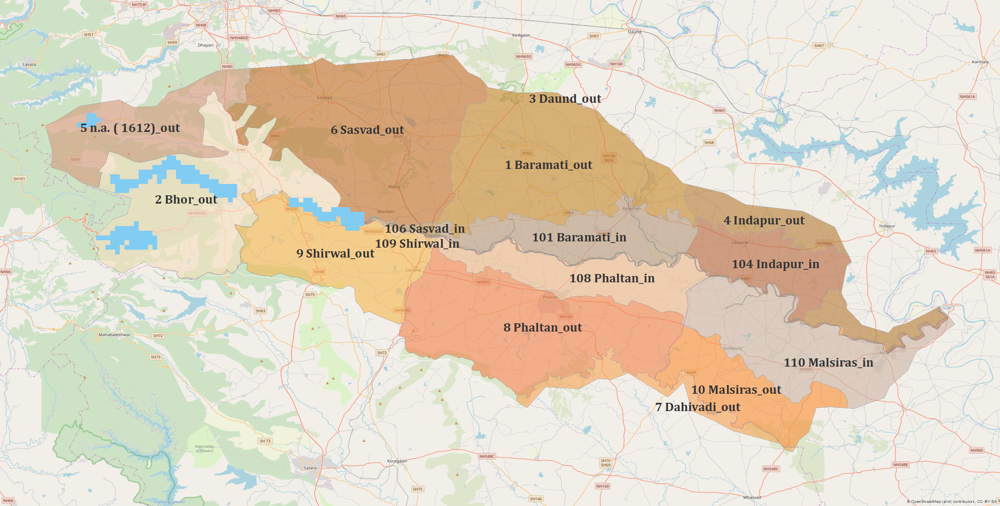

In [3]:
img = Image.open(photo_folder + '/admin_segments_Sarati.tif')
img

In [4]:
admin_segments_file = output_folder + "/adminSegments_daily.nc"
nc_admin_segments = Dataset(admin_segments_file, 'r')
admin_segments = nc_admin_segments.variables['adminSegments'][0,:,:]

The data above holds the monthly average value (ETRef, Rain, etc.) for each administrative unit in each cell of the administrative unit. 

The following code chooses a representative cell for each administrative unit.

In [5]:
Segment_reps = []

for i in range(nc_admin_segments.variables['lat'].shape[0]):
    for j in range (nc_admin_segments.variables['lon'].shape[0]):
        
        if admin_segments[i,j]>0 and admin_segments[i,j] not in [i[0] for i in Segment_reps]:       
            Segment_reps.append([int(admin_segments[i,j]), i, j])

Segment_reps.sort()

#for i in Segment_reps:
#    print('Segment ' +str(i[0])+ ', lat ' +str(i[1])+ ', lon ' +str(i[2]))

In [6]:
ETRef_monAvg_segments_file = output_folder + "/ETRefAverage_segments_monthavg.nc"
rain_monAvg_segments_file = output_folder + "/rainAverage_segments_monthavg.nc"

nc_ETRef_monAvg_segments = Dataset(ETRef_monAvg_segments_file, 'r')
nc_rain_monAvg_segments = Dataset(rain_monAvg_segments_file, 'r')

ETRef_monAvg_segments = nc_ETRef_monAvg_segments.variables['ETRefAverage_segments_monthavg'][:,:,:]
rain_monAvg_segments = nc_rain_monAvg_segments.variables['rainAverage_segments_monthavg'][:,:,:]

#print(nc_ETRef_monAvg_segments.variables['time'].units)

times = nc_ETRef_monAvg_segments.variables['time'][:]
Dates_simulated = [datetime.datetime(1900,1,1)+datetime.timedelta(seconds = 365.25/12*24.0*3600.0*float(val)) for val in times]



In [7]:
ETRef_monAvg_representative = []
rain_monAvg_representative= []

for seg in Segment_reps:
    
    ETRef_monAvg_representative.append([seg[0]])
    rain_monAvg_representative.append([seg[0]])
    
    for t in range(nc_ETRef_monAvg_segments.variables['time'].shape[0]):
        ETRef_monAvg_representative[-1].append(ETRef_monAvg_segments[t, seg[1], seg[2]])
        rain_monAvg_representative[-1].append(rain_monAvg_segments[t, seg[1], seg[2]])
        

## Rainfall

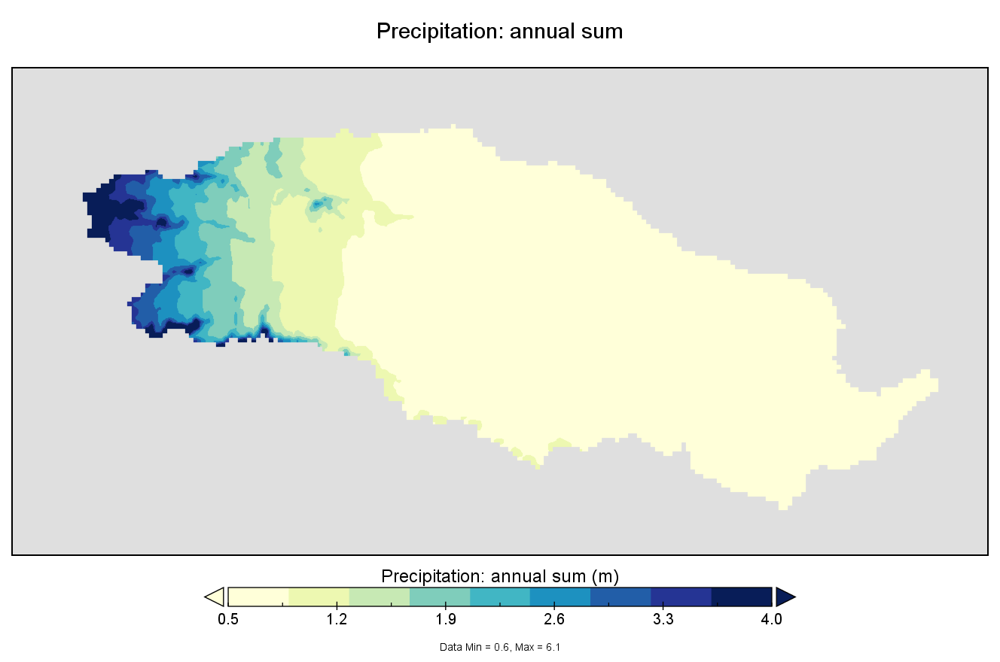

In [8]:
img = Image.open(photo_folder + '/sum_precipitation_annualtot.png')    # Open image as PIL image object
img


In [9]:
fig = go.Figure()
    
for i in rain_monAvg_representative:
    fig.add_trace(go.Scatter(y=i[1:],
                             x = Dates_simulated,
                             mode='lines',
                             name=i[0]))


fig.update_layout(title='Rainfall, averaged over segment and month',
                       xaxis_title='Month',
                       yaxis_title='Monthly Average Rainfall (m/day)')

fig.show()

The following output may allow for easier input into Excel.

In [10]:
for seg in rain_monAvg_representative:
    print(*seg, sep = ", ")

1, 0.0, 0.0, 7.1903276e-05, 0.0006820735, 0.005798126, 0.004142314, 0.004921867, 0.0010141514, 0.00029772642, 0.0021436953, 0.00040875643, 1.8704195e-06, 0.0, 2.4775417e-07, 0.0003255341, 0.0005014873, 0.0019928745, 0.002845706, 0.013313878, 0.003372253, 0.0051244576, 0.0027121606, 0.0004990071, 0.0011093477, 0.0, 0.00022831412, 0.00041912464, 0.0005523119, 0.001076898, 0.0013374949, 0.0041099093, 0.0030906494, 0.0010811422, 0.0036204048, 5.3735905e-05, 0.0, 0.0, 0.0, 6.903289e-06, 0.00013923568, 7.889595e-05, 0.0028707865, 0.0025577967, 0.0024808424, 0.0067866496, 0.0028667585, 0.0004316514, 0.0, 5.751337e-06, 0.0, 0.0, 0.0005195961, 0.00037077616, 0.00061352336, 0.0033580603, 0.0019625071, 0.002154834, 9.1838716e-05, 0.00017896066, 0.001771177, 3.605325e-05, 0.0, 7.4441477e-06, 0.00030263313, 0.0036143572, 0.0011211932, 0.00819338, 0.00091599737, 0.0023728816, 0.00033207616, 0.0028979918, 0.00027068553, 0.0, 0.0, 0.0, 0.000112305264, 0.00047536555, 0.002802901, 0.003702872, 0.0009953

3, 0.0, 0.0, 7.20583e-05, 0.0007830817, 0.006159595, 0.0042771017, 0.004379694, 0.0009065955, 0.00025328985, 0.0021633958, 0.00034098024, 0.0, 0.0, 0.0, 0.00051958306, 0.0005410456, 0.0018975353, 0.003927591, 0.014493348, 0.0032421546, 0.0051677995, 0.002807719, 0.00064503826, 0.001103847, 0.0, 0.0004496814, 0.00018454171, 0.00048051597, 0.001167527, 0.0014035782, 0.0036806809, 0.002888375, 0.00088744296, 0.0032723967, 2.5361605e-05, 0.0, 0.0, 0.0, 3.648696e-06, 8.307577e-05, 6.699451e-05, 0.0023804258, 0.0023411454, 0.002103612, 0.006507959, 0.0025149714, 0.00037130597, 0.0, 9.553218e-06, 0.0, 0.0, 0.000545411, 0.00043590044, 0.00055974437, 0.0029732243, 0.0015632943, 0.0020245435, 0.000121525205, 0.00015335288, 0.0018149333, 4.8447142e-05, 0.0, 2.4462164e-05, 0.00031337744, 0.0038808377, 0.00086965464, 0.0068155136, 0.00090618053, 0.0022180593, 0.0003178447, 0.003204358, 0.00029747144, 0.0, 0.0, 0.0, 8.6082844e-05, 0.0005129148, 0.0024852136, 0.0033632608, 0.0008221439, 0.0037432576,

5, 0.0, 0.0, 0.0, 0.00023487303, 0.0039925743, 0.013321205, 0.07096756, 0.019455045, 0.011599172, 0.0055073462, 0.00048704448, 0.0, 1.8272649e-05, 0.00032410753, 0.00029942385, 9.126125e-05, 0.0017090916, 0.004756218, 0.026621997, 0.014344647, 0.01050794, 0.0023775008, 0.0008907314, 0.002339648, 0.0, 1.0204885e-05, 0.0003695035, 0.0005238621, 0.00037922524, 0.009112211, 0.046677746, 0.03097036, 0.0041656606, 0.004684496, 9.63239e-05, 0.0, 0.0, 0.0, 6.269434e-05, 0.0003589047, 0.0006874292, 0.022007976, 0.028821174, 0.047126606, 0.011927738, 0.004288219, 0.0012650064, 4.0219158e-05, 8.4844454e-05, 0.0, 0.0, 0.000568722, 0.0004036452, 0.01577307, 0.06550247, 0.018327039, 0.0036238458, 0.0006558696, 0.00043089507, 0.0028753788, 0.0, 0.00022144995, 0.0, 8.0549784e-05, 0.006534137, 0.014759253, 0.06289308, 0.015836, 0.011609462, 0.0013282519, 0.0038656865, 0.00016441885, 0.0, 0.0, 0.00018446756, 0.00062771764, 0.00025669046, 0.015271041, 0.054146193, 0.02312465, 0.015910946, 0.004270433, 4.

9, 0.0, 0.0, 5.6699073e-06, 0.00055645924, 0.004133118, 0.0073454673, 0.019917015, 0.0038437513, 0.0022673253, 0.0018555012, 0.00058196764, 0.0, 6.620182e-06, 1.7990611e-05, 0.0002813528, 0.0010329973, 0.0021560066, 0.0009814757, 0.005783656, 0.006979021, 0.0047991113, 0.0016804695, 0.00050416205, 0.002174625, 0.0, 0.00015515341, 0.0017532647, 0.00070498465, 0.0005557855, 0.002578981, 0.010958288, 0.0071252133, 0.0015338404, 0.0032233503, 0.00015973033, 0.0, 0.0, 0.0, 4.8332455e-05, 0.00047829273, 0.000304251, 0.0059255636, 0.0065718596, 0.009352781, 0.005858554, 0.0034877409, 0.0012619288, 2.4838466e-05, 0.00020647248, 0.0, 0.0, 0.0007632799, 0.00070572674, 0.0015467373, 0.019347683, 0.0045763277, 0.0012156729, 0.00010194117, 0.00085393665, 0.0027645677, 2.0246401e-07, 0.0, 0.0, 0.00037144433, 0.0050304555, 0.0021706382, 0.018609751, 0.0025938984, 0.004834533, 0.0003766946, 0.002640957, 0.0001994763, 0.0, 0.0, 8.865039e-05, 0.00043442132, 0.00045256902, 0.0038434828, 0.013325641, 0.00

101, 0.0, 0.0, 4.9370385e-05, 0.0006294562, 0.006158271, 0.0046262615, 0.0033981968, 0.00077854376, 0.00019066693, 0.0020440244, 0.00041246557, 9.169871e-06, 0.0, 1.1964929e-06, 4.6988876e-05, 0.0003987922, 0.0022515475, 0.0018597641, 0.012719314, 0.0034724688, 0.0048152716, 0.00287291, 0.0004094049, 0.0011147059, 0.0, 0.00022755016, 0.0003413541, 0.0005675496, 0.00084890367, 0.0012056384, 0.0034782186, 0.0029461114, 0.0014432352, 0.004157558, 5.607015e-05, 0.0, 0.0, 0.0, 3.9585175e-06, 0.0001455847, 4.337606e-05, 0.0028852224, 0.0026533834, 0.0022069875, 0.008378074, 0.0029777207, 0.0004739686, 0.0, 1.2235297e-05, 0.0, 0.0, 0.00048963696, 0.00024692967, 0.0005943876, 0.002469721, 0.002397952, 0.0025405246, 6.761376e-05, 0.00014713002, 0.0016133804, 7.740262e-05, 0.0, 4.8446594e-07, 0.00023181718, 0.0036481398, 0.001282023, 0.007913348, 0.001244801, 0.002478272, 0.00036531154, 0.0032323448, 0.0001635633, 0.0, 0.0, 0.0, 0.00016266193, 0.00042600257, 0.0030317528, 0.0032145916, 0.0009903

106, 0.0, 0.0, 3.6383874e-05, 0.0005498835, 0.00484251, 0.0061120093, 0.011323764, 0.0021784818, 0.0009948246, 0.0017497804, 0.00053865626, 0.0, 0.0, 0.0, 0.0001311046, 0.0007491087, 0.0020673326, 0.0009950025, 0.006573776, 0.005436672, 0.005072744, 0.0020074402, 0.00025646595, 0.0013270171, 0.0, 0.0, 0.002111733, 0.0006014071, 0.0007361859, 0.002222405, 0.007067953, 0.005259439, 0.001358513, 0.0030844973, 0.00014921528, 0.0, 0.0, 0.0, 3.4054297e-05, 0.00037627644, 0.00018014702, 0.004472013, 0.004103546, 0.005720774, 0.005938325, 0.0034397081, 0.00086515426, 0.0, 0.0, 0.0, 0.0, 0.0005338327, 0.000546314, 0.0009473211, 0.010539753, 0.0032014714, 0.0014758016, 7.806975e-05, 0.0006229087, 0.0023240822, 0.0, 0.0, 0.0, 0.0003438694, 0.004249008, 0.001511785, 0.012939319, 0.0012402651, 0.0037965896, 0.00032340878, 0.002417695, 0.00025254014, 0.0, 0.0, 0.0, 9.578975e-05, 0.00040663962, 0.0034965405, 0.006848384, 0.0019502973, 0.0058043892, 0.0020058425, 5.5653775e-08, 0.0023685426, 0.0, 0.0,

110, 0.0, 0.0, 2.9770968e-06, 0.000205027, 0.0052587674, 0.0048361397, 0.0013759774, 0.00028957886, 0.0001836772, 0.0017182092, 0.00065248495, 0.00018543398, 7.4174017e-07, 3.8868002e-05, 0.0008546683, 0.00033075473, 0.0021642577, 0.0047969148, 0.014034602, 0.0076098507, 0.008238594, 0.0026117633, 0.0006387875, 0.0008602253, 0.0, 0.0002694388, 0.00027486501, 0.00015885229, 0.0004815445, 0.0029671427, 0.0025491153, 0.0024563605, 0.001969, 0.0035100922, 1.3112959e-05, 0.0, 0.0, 0.0, 5.9598588e-05, 0.0002883888, 1.2737252e-05, 0.000995495, 0.0037573164, 0.001338158, 0.009928685, 0.0027100798, 0.00075760426, 0.0, 7.71966e-06, 1.8348365e-07, 0.0, 0.0004255832, 0.00017071707, 0.0010462372, 0.0016705107, 0.0037939833, 0.001907065, 5.5320077e-05, 4.0735795e-05, 0.0013790604, 9.672576e-05, 0.0, 8.798379e-06, 2.7254759e-05, 0.002077241, 0.0016312565, 0.002373026, 0.0016824178, 0.0032823728, 0.00043251197, 0.0030436825, 0.0003921651, 0.0, 1.9191617e-07, 0.0, 0.00013461086, 0.0003634858, 0.0021710

## Reference Evapotranspiration

Amounts are given in metres [m]

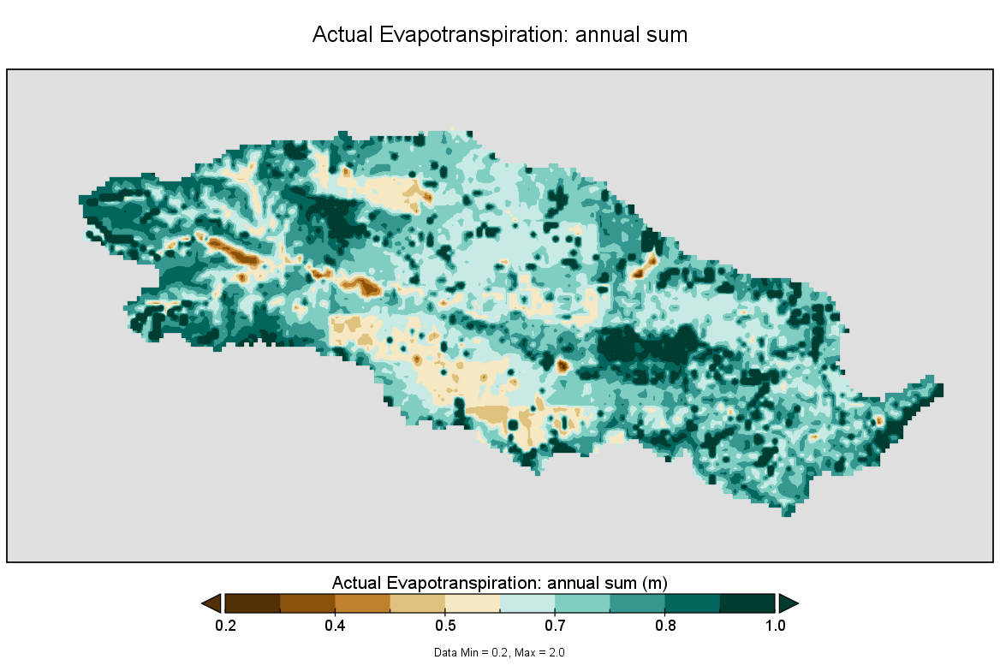

In [11]:
img = Image.open(photo_folder + '/sum_actualET_annualtot.png')
img

In [12]:
fig = go.Figure()

for i in ETRef_monAvg_representative:
    fig.add_trace(go.Scatter(y=i[1:],
                    x = Dates_simulated,
                    mode='lines',
                    name=i[0]))


fig.update_layout(title='Reference Evapotranspiration, averaged over segment and month',
                       xaxis_title='Month',
                       yaxis_title='Monthly Average Reference ET (m/day)')

fig.show()

The following output may allow for easier input into Excel.

In [13]:
for seg in ETRef_monAvg_representative:
    print(*seg, sep = ", ")

1, 0.0032599473, 0.0037187662, 0.005601335, 0.006211193, 0.005293453, 0.0036347562, 0.0013995685, 0.0028671713, 0.0037497776, 0.003325882, 0.0033425316, 0.0026273604, 0.0026758488, 0.0041129095, 0.005297874, 0.0065432796, 0.006585913, 0.004234044, 0.0026786984, 0.0028070644, 0.003025846, 0.003594401, 0.0034145291, 0.0024855942, 0.0034480493, 0.004337219, 0.0051776986, 0.0058836397, 0.0059428746, 0.0039003121, 0.0019514558, 0.0019861404, 0.0036066, 0.0036435302, 0.003559159, 0.003194942, 0.0034025393, 0.00471127, 0.0060646697, 0.0067342753, 0.0065787127, 0.0041648187, 0.0026577348, 0.0027584617, 0.003251679, 0.003824009, 0.0032520797, 0.002978766, 0.0034553898, 0.00439557, 0.0046949238, 0.0058236476, 0.0064847968, 0.0040730126, 0.002618683, 0.0027861192, 0.0035621545, 0.0039778436, 0.0037288237, 0.0034861872, 0.003219788, 0.0048699416, 0.0055088797, 0.006120762, 0.0065412824, 0.0041502286, 0.0023195627, 0.0028985671, 0.003590842, 0.004153888, 0.0030344701, 0.0026870575, 0.003387528, 0.0

4, 0.0034545592, 0.003914172, 0.005890589, 0.0064069047, 0.005331519, 0.0036293266, 0.0015979129, 0.0030608901, 0.0039600655, 0.0033967113, 0.0034755995, 0.0027259178, 0.0028138594, 0.0042598243, 0.0053772405, 0.006613535, 0.0067410143, 0.004620898, 0.0030019598, 0.0030010974, 0.003086702, 0.0037275017, 0.0035623333, 0.0025691292, 0.0036571387, 0.0046241665, 0.0053209006, 0.0059092003, 0.006198425, 0.0040013622, 0.0021732152, 0.0021524942, 0.0037924978, 0.003724247, 0.0037269997, 0.0033946547, 0.0035321608, 0.004897324, 0.006217457, 0.007069728, 0.0070510423, 0.0045509245, 0.0028478368, 0.002946544, 0.003328471, 0.003936682, 0.0034210812, 0.0032365264, 0.0036291003, 0.0044894144, 0.004839658, 0.0060492055, 0.006984486, 0.0044412883, 0.0028774065, 0.0029658454, 0.0037127598, 0.004138951, 0.0039701136, 0.0036008891, 0.0033277695, 0.0050230585, 0.005658807, 0.0061416873, 0.0069867503, 0.0044824434, 0.0026136884, 0.0030593409, 0.003660182, 0.00424096, 0.0031064807, 0.002740567, 0.003506715

8, 0.003191793, 0.0036482876, 0.0056234743, 0.0063103354, 0.005418966, 0.0036518683, 0.0014786142, 0.0029244458, 0.0038231902, 0.0034012524, 0.0033669954, 0.0026200127, 0.0026860759, 0.00408701, 0.005331615, 0.0066767535, 0.006588357, 0.0044100853, 0.0028182643, 0.0028548588, 0.003072679, 0.0036984927, 0.0034272189, 0.0024833563, 0.0033992953, 0.004320272, 0.0052315453, 0.0060636452, 0.006117031, 0.0041578542, 0.0020326506, 0.002099147, 0.0036502865, 0.0037058094, 0.0035592152, 0.0031458961, 0.0033763729, 0.0046969852, 0.006084019, 0.006855375, 0.006689756, 0.004266748, 0.00270852, 0.0028012106, 0.0034716327, 0.0038640958, 0.003245007, 0.0029581406, 0.0033769738, 0.004229009, 0.004748014, 0.0059026643, 0.0066464846, 0.004194953, 0.0026900244, 0.0028035527, 0.0035786498, 0.0040418664, 0.0037580724, 0.003492297, 0.0031787085, 0.004852737, 0.005502782, 0.0062424014, 0.0066758837, 0.0042846096, 0.002431983, 0.00294043, 0.0036163905, 0.004228743, 0.003093105, 0.002719119, 0.003371281, 0.004

101, 0.0032878171, 0.00373211, 0.0056622894, 0.0062597413, 0.0052963807, 0.0036396086, 0.0014752792, 0.0029278363, 0.0038155788, 0.0033489026, 0.0033680648, 0.0026429815, 0.002700484, 0.00413688, 0.005334211, 0.0066026957, 0.0065964307, 0.0043287785, 0.0028190573, 0.0028605594, 0.0030542763, 0.003631232, 0.0034436444, 0.0024998726, 0.0034797161, 0.004382016, 0.005210569, 0.0059132506, 0.0059868293, 0.003945369, 0.0020201877, 0.0020510957, 0.0036550802, 0.0036658244, 0.0035889978, 0.0032215372, 0.0034217834, 0.004744735, 0.0061099534, 0.0068109576, 0.006639119, 0.004244507, 0.0026997991, 0.0028130573, 0.003312139, 0.0038542892, 0.0032854716, 0.0030222393, 0.0034841942, 0.004407731, 0.0047144406, 0.0058509936, 0.0065573156, 0.004154382, 0.00269322, 0.0028247647, 0.003599667, 0.004021766, 0.0037854242, 0.003515534, 0.003239665, 0.0049202708, 0.005533402, 0.006134301, 0.006594457, 0.004229392, 0.0024017296, 0.0029415092, 0.0036117851, 0.0041873436, 0.0030615588, 0.0026989107, 0.0034063482,

110, 0.0034491597, 0.0039177416, 0.0059262738, 0.006473118, 0.0053936937, 0.0037073572, 0.0016302131, 0.0030760507, 0.004014783, 0.003459272, 0.003514473, 0.0027465317, 0.0028471225, 0.0042673578, 0.0053994376, 0.0066762147, 0.0067415047, 0.00472951, 0.0030320482, 0.0030190353, 0.00311896, 0.0038157564, 0.0035961252, 0.0025843722, 0.003661687, 0.004637691, 0.005363439, 0.0060397745, 0.006293132, 0.004208702, 0.0022112948, 0.0021903552, 0.0038365037, 0.0037913828, 0.0037563974, 0.0034068923, 0.003565057, 0.004928157, 0.006244725, 0.007156152, 0.007127659, 0.004629476, 0.0028754892, 0.0029553296, 0.0034071933, 0.0039951224, 0.0034531278, 0.0032581238, 0.0036122908, 0.004440986, 0.004885423, 0.0061179376, 0.0070969565, 0.004526133, 0.0029084603, 0.0029688196, 0.0037368068, 0.0042028525, 0.0040114587, 0.0036504641, 0.003334675, 0.005039237, 0.005676175, 0.0062132366, 0.007073657, 0.0045680287, 0.002671632, 0.0030705458, 0.003689565, 0.0042960076, 0.00315242, 0.0027418379, 0.0035119231, 0.0

In [14]:
sugarAdsali_segments_file = output_folder + "/areaCrops_Irr_segment[1]_daily.nc"
sugarPreSeasonal_segments_file = output_folder + "/areaCrops_Irr_segment[2]_daily.nc"
sugarSuru_segments_file = output_folder + "/areaCrops_Irr_segment[3]_daily.nc"
sorghum_segments_file = output_folder + "/areaCrops_Irr_segment[4]_daily.nc"

nc_sugarAdsali_segments = Dataset(sugarAdsali_segments_file, 'r')
nc_sugarPreSeasonal_segments = Dataset(sugarPreSeasonal_segments_file, 'r')
nc_sugarSuru_segments = Dataset(sugarSuru_segments_file, 'r')
nc_sorghum_segments = Dataset(sorghum_segments_file, 'r')

sugarAdsali_segments = nc_sugarAdsali_segments.variables['areaCrops_Irr_segment[1]'][0,:,:]
sugarPreSeasonal_segments = nc_sugarPreSeasonal_segments.variables['areaCrops_Irr_segment[2]'][0,:,:]
sugarSuru_segments = nc_sugarSuru_segments.variables['areaCrops_Irr_segment[3]'][0,:,:]
sorghum_segments = nc_sorghum_segments.variables['areaCrops_Irr_segment[4]'][0,:,:]

In [15]:
sugarAdsali_representative = []
sugarPreSeasonal_representative = []
sugarSuru_representative = []
sorghum_representative = []

for seg in Segment_reps:
    
    sugarAdsali_representative.append([seg[0], sugarAdsali_segments[seg[1], seg[2]]])
    sugarPreSeasonal_representative.append([seg[0], sugarPreSeasonal_segments[seg[1], seg[2]]])
    sugarSuru_representative.append([seg[0], sugarSuru_segments[seg[1], seg[2]]])
    sorghum_representative.append([seg[0], sorghum_segments[seg[1], seg[2]]])

## Crop-specific  areas

Units are given in m2.

In [16]:
sugarAdsali = np.array([i[1] for i in sugarAdsali_representative])
sugarPreSeasonal = np.array([i[1] for i in sugarAdsali_representative])
sugarSuru = np.array([i[1] for i in sugarSuru_representative])
sorghum = [i[1] for i in sorghum_representative]

Crop = [sugarAdsali, sugarPreSeasonal, sugarSuru, sorghum]

Crop_name = ['Sugarcane, variety Adsali', 'Sugarcane, variety Pre-Seasonal', 'Sugarcane, variety Suru', 'Sorghum']

fig = go.Figure()
x=['s'+str(i[0]) for i in sugarAdsali_representative]

for c in range(len(Crop)):
        fig.add_trace(go.Bar(x = x, 
                             y = Crop[c],
                             name = Crop_name[c]))

fig.update_layout(title='Crop areas',
                  xaxis_title='Segment',
                  yaxis_title='Area (m2)', 
                  barmode='stack')

fig.show()

The following output may allow for easier input into Excel.

In [17]:
for i in range(len(Segment_reps)):
    print(str(sugarAdsali_representative[i][0]) + ', '+ str(sugarAdsali_representative[i][1]) + ', ' + str(sugarPreSeasonal_representative[i][1]) + ', ' + str(sugarSuru_representative[i][1]) + ', ' + str(sorghum_representative[i][1]))

1, 7398326.0, 20507428.0, 7810933.0, 37306910.0
2, 8928162.0, 24547600.0, 7891208.5, 11802677.0
3, 7211.4707, 8749.339, 3127.634, 6430.7476
4, 3856967.0, 11075507.0, 5159695.5, 60302720.0
5, 4290064.5, 11809850.0, 3894564.0, 7244894.5
6, 12850549.0, 36198190.0, 13165909.0, 37408524.0
7, 997894.5, 2743766.8, 983401.44, 152010.5
8, 8591854.0, 23987994.0, 8931055.0, 25231600.0
9, 5200022.0, 14351692.0, 4688807.5, 5700084.5
10, 3656096.8, 10089222.0, 4176961.5, 19532572.0
101, 8577042.0, 25597036.0, 14022638.0, 176275730.0
104, 6164584.0, 18364044.0, 10719324.0, 161501580.0
106, 292202.0, 864091.5, 310614.88, 2359655.0
108, 9067185.0, 27111428.0, 14915146.0, 122440344.0
109, 310060.25, 913120.75, 366570.9, 809670.8
110, 17674034.0, 52390990.0, 31581992.0, 286415500.0


In [18]:
PETTotVol_sugarAdsali_segments_file = output_folder + "/PET_Sugar1_segments_monthtot.nc"
PETTotVol_sugarPreSeasonal_segments_file = output_folder + "/PET_Sugar2_segments_monthtot.nc"
PETTotVol_sugarSuru_segments_file = output_folder + "/PET_Sugar3_segments_monthtot.nc"
PETTotVol_sorghum_segments_file = output_folder + "/PET_Sorghum_segments_monthtot.nc"

nc_PETTotVol_sugarAdsali_segments = Dataset(PETTotVol_sugarAdsali_segments_file, 'r')
nc_PETTotVol_sugarPreSeasonal_segments = Dataset(PETTotVol_sugarPreSeasonal_segments_file, 'r')
nc_PETTotVol_sugarSuru_segments = Dataset(PETTotVol_sugarSuru_segments_file, 'r')
nc_PETTotVol_sorghum_segments = Dataset(PETTotVol_sorghum_segments_file, 'r')

PETTotVol_sugarAdsali_segments = nc_PETTotVol_sugarAdsali_segments.variables['PET_Sugar1_segments_monthtot'][:,:,:]
PETTotVol_sugarPreSeasonal_segments = nc_PETTotVol_sugarPreSeasonal_segments.variables['PET_Sugar2_segments_monthtot'][:,:,:]
PETTotVol_sugarSuru_segments = nc_PETTotVol_sugarSuru_segments.variables['PET_Sugar3_segments_monthtot'][:,:,:]
PETTotVol_sorghum_segments = nc_PETTotVol_sorghum_segments.variables['PET_Sorghum_segments_monthtot'][:,:,:]

PETTotVol_sugarAdsali_representative = []
PETTotVol_sugarPreSeasonal_representative = []
PETTotVol_sugarSuru_representative = []
PETTotVol_sorghum_representative = []

for seg in Segment_reps:
    
    PETTotVol_sugarAdsali_representative.append([seg[0]])
    PETTotVol_sugarPreSeasonal_representative.append([seg[0]])
    PETTotVol_sugarSuru_representative.append([seg[0]])
    PETTotVol_sorghum_representative.append([seg[0]])
    
    for t in range(nc_ETRef_monAvg_segments.variables['time'].shape[0]):
        
        PETTotVol_sugarAdsali_representative[-1].append(PETTotVol_sugarAdsali_segments[t, seg[1], seg[2]])
        PETTotVol_sugarPreSeasonal_representative[-1].append(PETTotVol_sugarPreSeasonal_segments[t, seg[1], seg[2]])
        PETTotVol_sugarSuru_representative[-1].append(PETTotVol_sugarSuru_segments[t, seg[1], seg[2]])
        PETTotVol_sorghum_representative[-1].append(PETTotVol_sorghum_segments[t, seg[1], seg[2]])
    


## Potential evapotranspiration: Crop- and segment-specific 

Units are in m per month

In [19]:
Crop_name = ['Sugarcane, variety Adsali', 'Sugarcane, variety Pre-Seasonal', 'Sugarcane, variety Suru', 'Sorghum']

Crop = [PETTotVol_sugarAdsali_representative, PETTotVol_sugarPreSeasonal_representative, 
        PETTotVol_sugarSuru_representative, PETTotVol_sorghum_representative]

for c in range(len(Crop)):
    fig = go.Figure()

    for i in Crop[c]:
        fig.add_trace(go.Scatter(y=i[1:],
                                 x = Dates_simulated,
                                 mode='lines',
                                 name=i[0]))

    fig.update_layout(title='Monthly Total Potential ET: '+ Crop_name[c],
                       xaxis_title='Month',
                       yaxis_title='Potential ET (m3/month)')

    fig.show()

The following outputs may allow for easier input into Excel.

In [20]:
for c in range(len(Crop)):
    print(Crop_name[c])
    for seg in Crop[c]:
        print(*seg, sep = ", ")
    print('\n')

Sugarcane, variety Adsali
1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.3864271, 0.15556863, 0.6353807, 0.80380005, 0.73421276, 1.1169966, 0.9076953, 0.9253623, 1.2841268, 1.8300743, 2.1847086, 2.2730145, 1.4190292, 0.929004, 0.5831764, 0.6066601, 0.744561, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.41537878, 0.21652204, 0.4402954, 0.77296996, 0.8044561, 1.1905897, 1.1065143, 1.1762457, 1.5235944, 2.0967512, 2.2539086, 2.2768428, 1.3961495, 0.9194017, 0.5729504, 0.65145797, 0.79230344, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.43681753, 0.29035938, 0.6174395, 0.7632627, 0.8798507, 1.2492857, 1.2034388, 1.1130486, 1.5214074, 1.9031013, 2.0408018, 2.262079, 1.3901378, 0.8047091, 0.6015465, 0.7198427, 0.85996073, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.4388477, 0.21619084, 0.6538313, 0.5486388, 0.8961063, 1.2513875, 0.9410839, 1.0634812, 1.2957199, 1.945168, 2.1842833, 2.422282, 1.5184436, 0.5939805, 0.63848454, 0.71213436, 0.82460284, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.48111185, 0.30726182, 0.6226018, 0.7845183, 0.

4, 0.0, 0.0, 0.0, 0.0, 0.0, 0.30376804, 0.13950779, 0.527672, 0.66076994, 0.5850647, 0.9053564, 0.73375505, 0.7586229, 1.030409, 1.4351772, 1.7116547, 1.7998537, 1.2076672, 0.81123346, 0.48503911, 0.48136455, 0.60364753, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.33687258, 0.18875273, 0.37351894, 0.6316099, 0.6416838, 0.96889454, 0.91141486, 0.94889253, 1.2276891, 1.6600281, 1.8365512, 1.8929625, 1.1875685, 0.76708317, 0.4761506, 0.5210151, 0.6349285, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.3710909, 0.24914514, 0.50959545, 0.61667496, 0.7122041, 1.0328349, 0.9679099, 0.89112926, 1.2107226, 1.5141813, 1.5943134, 1.8777087, 1.169176, 0.7104136, 0.49342784, 0.57013565, 0.6831031, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.36892414, 0.18909109, 0.54912573, 0.44197074, 0.715168, 1.010349, 0.7357444, 0.83384615, 1.0202224, 1.5446163, 1.7234855, 2.0004027, 1.285401, 0.56349474, 0.5380985, 0.53434473, 0.66296756, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.4061054, 0.2638851, 0.5131592, 0.6259408, 0.7609463, 0.8512

7, 0.0, 0.0, 0.0, 0.0, 0.0, 0.05045571, 0.019962538, 0.08260584, 0.10594088, 0.098774195, 0.14903614, 0.12011638, 0.123944536, 0.16991518, 0.24433835, 0.29485336, 0.3013299, 0.19641478, 0.1250276, 0.07641611, 0.07894374, 0.10180957, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.058021635, 0.028686518, 0.058415122, 0.10275309, 0.108179316, 0.15845244, 0.14651515, 0.15599981, 0.20289151, 0.28025094, 0.3073364, 0.31034, 0.19041817, 0.122772224, 0.0742159, 0.08944959, 0.10634904, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.059734073, 0.038129073, 0.081136905, 0.10066715, 0.11890455, 0.1686363, 0.16086814, 0.14639454, 0.20235215, 0.25243327, 0.27431384, 0.30853474, 0.19033086, 0.11008325, 0.07895453, 0.094649225, 0.1152415, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.05968149, 0.028602546, 0.08518975, 0.072700165, 0.119544365, 0.16616829, 0.12265362, 0.13861537, 0.17176157, 0.2588598, 0.2922467, 0.33178258, 0.20798327, 0.07861655, 0.08381355, 0.100251265, 0.11186519, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.06572262,

101, 0.0, 0.0, 0.0, 0.0, 0.0, 0.7704125, 0.3231377, 1.2822608, 1.6169842, 1.4658602, 2.2298872, 1.8080542, 1.8476733, 2.5565681, 3.649589, 4.3711166, 4.512895, 2.8673537, 1.9292351, 1.1745193, 1.2130345, 1.4902554, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.83543205, 0.44245893, 0.89828604, 1.5489329, 1.604639, 2.3765776, 2.2048929, 2.3412397, 3.0372882, 4.1809864, 4.510757, 4.5442085, 2.8117917, 1.8474301, 1.1549715, 1.3151159, 1.5819108, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.8806145, 0.5898162, 1.237189, 1.5254111, 1.7609007, 2.5070083, 2.4048822, 2.2166138, 3.0413008, 3.786095, 4.060155, 4.513091, 2.8013124, 1.6439497, 1.2075822, 1.4344236, 1.7183797, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.8834545, 0.4414522, 1.3231764, 1.0958679, 1.7854543, 2.4962554, 1.867222, 2.1063876, 2.5741706, 3.8684747, 4.344348, 4.8362217, 3.0628977, 1.2220274, 1.293168, 1.4331026, 1.6576769, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.96996814, 0.6245585, 1.2496102, 1.5700055, 1.8883371, 2.1717992, 2.1488352, 2.0753205, 2

109, 0.0, 0.0, 0.0, 0.0, 0.0, 0.028215336, 0.010850405, 0.043688156, 0.05511976, 0.051308084, 0.07621971, 0.06211252, 0.06332189, 0.08787427, 0.12752248, 0.15457183, 0.15791892, 0.096854225, 0.06529673, 0.039862394, 0.04246487, 0.051728003, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.030114071, 0.014831096, 0.032857023, 0.052526508, 0.05612437, 0.080322795, 0.07326778, 0.08095618, 0.104211554, 0.1449458, 0.15600517, 0.15406866, 0.09423485, 0.06218345, 0.039110325, 0.046273388, 0.054658905, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.029589614, 0.019723698, 0.041351926, 0.051677324, 0.060234614, 0.083888926, 0.08285999, 0.07555935, 0.103609264, 0.13244396, 0.1468184, 0.15403272, 0.094833806, 0.054307017, 0.04094725, 0.049541827, 0.059789017, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.029989362, 0.014911076, 0.044730637, 0.037629195, 0.06223573, 0.08522379, 0.06575581, 0.07473644, 0.091915354, 0.13617814, 0.15373509, 0.16473818, 0.10300493, 0.040887523, 0.04374427, 0.054408927, 0.057371408, 0.0, 0.0, 0.0, 0

1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.6966475, 3.3018882, 2.6826982, 2.733337, 5.928014, 8.45146, 10.095355, 10.502239, 6.546169, 4.28422, 4.485232, 4.671749, 3.439354, 3.163063, 2.3785415, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.8587798, 3.5176883, 3.2663393, 3.4753082, 7.033599, 9.678872, 10.402762, 10.506233, 6.4399953, 4.244358, 4.407402, 5.017632, 3.6596115, 3.0144737, 2.856582, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0311134, 3.6882298, 3.558152, 3.2884538, 7.021522, 8.788555, 9.436958, 10.4423685, 6.414712, 3.7104714, 4.6285686, 5.5428257, 3.9736757, 2.8084207, 2.5703387, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0704257, 3.697972, 2.7855642, 3.1474438, 5.9886117, 8.986454, 10.094269, 11.181376, 7.0044746, 2.73849, 4.90891, 5.509473, 3.8087401, 3.2167451, 3.0489502, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.1800904, 3.2245395, 3.1791363, 3.0944648, 6.3500204, 9.333333, 9.827592, 10.171158, 5.603975, 4.3413033, 4.4609194, 5.8046246, 3.6082737, 

4, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.95961624, 1.9007818, 1.5404202, 1.5919902, 3.383803, 4.716092, 5.621969, 5.9148626, 3.9591882, 2.6595972, 2.6519394, 2.6332705, 1.9788498, 1.8249875, 1.3591729, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0523889, 2.035133, 1.9146203, 1.9928057, 4.031052, 5.4546475, 6.027683, 6.213664, 3.8948255, 2.5162935, 2.6035273, 2.8474765, 2.083351, 1.7523965, 1.7136286, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.1684139, 2.16903, 2.0325346, 1.872943, 3.9789965, 4.9732203, 5.233019, 6.162129, 3.834688, 2.3259768, 2.6989226, 3.1195421, 2.242128, 1.5920128, 1.4479121, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.1732821, 2.1225002, 1.5460714, 1.751265, 3.348657, 5.0720277, 5.660057, 6.564681, 4.216077, 1.8490477, 2.940986, 2.9138634, 2.1741848, 1.8007076, 1.7937651, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.2481623, 1.7878155, 1.80647, 1.7265393, 3.584478, 5.3064013, 5.5699615, 5.9592023, 2.9602444, 2.7141168, 2.664757, 3.315747, 2.042

7, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.234101, 0.4522558, 0.36424533, 0.3760928, 0.8051307, 1.1568924, 1.3963813, 1.4281573, 0.9342826, 0.595726, 0.60596883, 0.62460524, 0.4825606, 0.43309045, 0.32304326, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.25634453, 0.48087308, 0.44464368, 0.47326067, 0.9618265, 1.3275148, 1.4573492, 1.4734493, 0.9057106, 0.58336926, 0.5877571, 0.70691633, 0.5040189, 0.413318, 0.39503875, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.28178313, 0.5117527, 0.4879128, 0.44397223, 0.9588544, 1.1960982, 1.2989101, 1.4648833, 0.9049089, 0.5242509, 0.6251491, 0.74784863, 0.5460122, 0.3865614, 0.34760463, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.28321174, 0.5039757, 0.37168023, 0.420159, 0.8135194, 1.2264489, 1.3845156, 1.5747192, 0.98910666, 0.37623662, 0.66520345, 0.7911607, 0.5302454, 0.44840583, 0.41931555, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.3027891, 0.43869498, 0.43766248, 0.415921, 0.8696345, 1.2875482, 1.3630958, 1.4459815, 0.71

101, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.2008917, 4.2855644, 3.4748647, 3.5510528, 7.6772184, 10.9591255, 13.125468, 13.551272, 8.609986, 5.792761, 5.8779726, 6.070766, 4.475097, 4.108253, 3.0814128, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.4092684, 4.5675287, 4.2376547, 4.499573, 9.12069, 12.554903, 13.545062, 13.645632, 8.443193, 5.5473533, 5.7800913, 6.581682, 4.7503414, 3.9201, 3.7280564, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.643941, 4.818264, 4.6218586, 4.2601085, 9.13277, 11.368985, 12.191482, 13.552103, 8.411671, 4.9362764, 6.0435104, 7.178961, 5.160101, 3.6511812, 3.3259394, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.6807606, 4.79751, 3.5884671, 4.0481086, 7.7298117, 11.616266, 13.045073, 14.522466, 9.197196, 3.669189, 6.471738, 7.171689, 4.9778433, 4.1769586, 3.9666374, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.835239, 4.1737957, 4.1297646, 3.9884634, 8.224571, 12.101716, 12.740437, 13.259145, 7.093435, 5.759395, 5.878391, 7.5576196, 4.681874

109, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.077252164, 0.14688982, 0.11970275, 0.12203948, 0.26462054, 0.3840097, 0.46545917, 0.47553703, 0.29166538, 0.19664823, 0.2000802, 0.21313715, 0.15576957, 0.13939081, 0.10548708, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.08450383, 0.1547965, 0.14120033, 0.1560243, 0.31381363, 0.43647453, 0.46977606, 0.46394628, 0.28377676, 0.18726523, 0.19630823, 0.23224984, 0.16459551, 0.13211025, 0.12112979, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.09069269, 0.1616703, 0.15968433, 0.14562313, 0.31199983, 0.39882827, 0.4421131, 0.4638382, 0.28558102, 0.16355161, 0.20552231, 0.2486526, 0.18004283, 0.12712005, 0.116317056, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.09370574, 0.16424291, 0.12672094, 0.14403763, 0.27678803, 0.41007188, 0.46293923, 0.49607402, 0.31018677, 0.12314102, 0.21956475, 0.2730795, 0.17276292, 0.14909579, 0.13356158, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.09877132, 0.14925277, 0.14250445, 0.1409792, 0.2914184,

1, 0.59204155, 1.2189591, 2.0336282, 3.4038944, 2.9904401, 1.9817363, 0.7983646, 1.6276076, 2.0589929, 1.881588, 1.0987556, 0.89254344, 0.48533022, 1.3468926, 1.9202077, 3.5842042, 3.7265637, 2.3278108, 1.5273364, 1.5933143, 1.657454, 2.035306, 1.1229392, 0.8440257, 0.6261184, 1.4228565, 1.8761562, 3.2165666, 3.365323, 2.1313555, 1.1103472, 1.1289864, 1.9797403, 2.0613587, 1.170903, 1.0875815, 0.6168705, 1.5982465, 2.1996226, 3.696051, 3.7335134, 2.2894495, 1.5077138, 1.5654178, 1.7819254, 2.165238, 1.0706328, 1.0154791, 0.6272459, 1.4390849, 1.7005799, 3.1923022, 3.6806076, 2.238638, 1.4884819, 1.5811231, 1.9545907, 2.2543397, 1.2289052, 1.1840657, 0.58367985, 1.5961269, 1.9963733, 3.3469512, 3.7099557, 2.2800968, 1.3206036, 1.6436182, 1.9665934, 2.3507318, 0.9967247, 0.9117928, 0.6140927, 1.6083617, 1.9982089, 3.4927332, 3.735915, 2.2490678, 1.1084524, 1.674974, 1.4052447, 2.2957795, 1.2307079, 0.9256568, 0.5577633, 1.359575, 2.040825, 3.5816364, 3.9725575, 2.4903219, 0.9748555, 1.74

4, 0.44382352, 0.90908206, 1.5158405, 2.495414, 2.1457233, 1.4207093, 0.65192825, 1.2355006, 1.546872, 1.3709723, 0.81356657, 0.659285, 0.363226, 0.9893151, 1.3823123, 2.5748138, 2.7035701, 1.8052453, 1.2141359, 1.2108291, 1.2045118, 1.5063659, 0.83332336, 0.6207943, 0.4701445, 1.0741514, 1.3705635, 2.3097231, 2.4975085, 1.5761172, 0.88189656, 0.873293, 1.4790418, 1.5030739, 0.8711368, 0.81916, 0.45533872, 1.1790332, 1.598215, 2.7541564, 2.8358657, 1.7750111, 1.1487286, 1.1890084, 1.3025545, 1.5868993, 0.8001078, 0.78155386, 0.46561974, 1.0391953, 1.2469028, 2.3565485, 2.8134973, 1.7333217, 1.164728, 1.1933019, 1.4454367, 1.6682668, 0.9282864, 0.87126356, 0.4279917, 1.1658587, 1.4550021, 2.393884, 2.812033, 1.7489839, 1.0604805, 1.2328264, 1.4260046, 1.7085866, 0.72774637, 0.66137624, 0.45097756, 1.1829555, 1.4501536, 2.5517032, 2.7951415, 1.7248325, 0.8831417, 1.2851863, 1.0350212, 1.6746391, 0.90876806, 0.6624495, 0.39997202, 0.97990084, 1.4835495, 2.5886447, 2.99769, 1.9226351, 0.83

6, 1.0178331, 2.163793, 3.56908, 6.033908, 5.3567805, 3.5509105, 1.2339953, 2.6795158, 3.449958, 3.295112, 1.9018434, 1.5629954, 0.8549613, 2.361384, 3.4260514, 6.392852, 6.572322, 3.854019, 2.422287, 2.638486, 2.8677373, 3.5514486, 1.9203933, 1.463136, 1.0710164, 2.4510274, 3.3742566, 5.8287783, 5.889465, 3.7319593, 1.7821581, 2.0805185, 3.3358989, 3.6355648, 2.0091426, 1.8585956, 1.1043645, 2.8110566, 3.8968365, 6.4896975, 6.349576, 3.7822645, 2.4967475, 2.5703583, 3.048929, 3.7763777, 1.8316437, 1.6797258, 1.0679235, 2.515976, 2.9994948, 5.564554, 6.2210183, 3.6944506, 2.399052, 2.6079936, 3.2995403, 3.8759875, 2.0818553, 2.0755415, 1.0195938, 2.773646, 3.5628333, 6.1544647, 6.3373346, 3.7854526, 2.097969, 2.734985, 3.384236, 4.0945354, 1.7414427, 1.6145793, 1.0949253, 2.8447204, 3.5279994, 6.2093883, 6.4446225, 3.7557359, 1.795077, 2.7304635, 2.3918278, 4.0378923, 2.135172, 1.6600889, 1.0133288, 2.4887435, 3.6545763, 6.4174294, 6.787273, 4.122456, 1.5477521, 2.849602, 3.5543149, 3.

8, 0.6673386, 1.3776996, 2.343835, 3.9682455, 3.5143158, 2.3046646, 0.96347237, 1.9046993, 2.410365, 2.209887, 1.2719551, 1.0248729, 0.559836, 1.5399814, 2.2203865, 4.197178, 4.286009, 2.7680025, 1.8347775, 1.859536, 1.9366391, 2.4019074, 1.2954198, 0.9702786, 0.7100056, 1.6281646, 2.1776788, 3.8082564, 3.9663396, 2.6047032, 1.3221779, 1.3640976, 2.3015807, 2.4094324, 1.346017, 1.2324808, 0.7047232, 1.831977, 2.5347545, 4.3109965, 4.3453293, 2.6831882, 1.7614002, 1.8252337, 2.1729658, 2.5150836, 1.2283888, 1.1574451, 0.70590377, 1.5989753, 1.9746853, 3.7105207, 4.3137565, 2.636298, 1.7512807, 1.8267237, 2.2574606, 2.6291037, 1.4209949, 1.3659626, 0.6636336, 1.8278192, 2.2931805, 3.921658, 4.3340826, 2.6914692, 1.5800192, 1.9142914, 2.2795193, 2.7488956, 1.1669859, 1.0598941, 0.7030122, 1.8465406, 2.292731, 4.084055, 4.3726506, 2.6454864, 1.3231467, 1.9643089, 1.6375362, 2.6654718, 1.4144379, 1.0630308, 0.63939357, 1.5719135, 2.3595295, 4.1612787, 4.647167, 2.933201, 1.1672612, 2.05834,

10, 0.33999404, 0.69795823, 1.1763378, 1.9540313, 1.6901048, 1.1170065, 0.49734843, 0.95388293, 1.2061441, 1.0801127, 0.6319143, 0.5079614, 0.28103772, 0.76479375, 1.0820763, 2.0288365, 2.1033711, 1.4195905, 0.9326086, 0.93592227, 0.9420821, 1.1874384, 0.6465649, 0.4799116, 0.36139297, 0.82643914, 1.0679647, 1.8338574, 1.9625968, 1.280926, 0.6792224, 0.68024385, 1.1534111, 1.1817821, 0.6750343, 0.6292547, 0.35335135, 0.91665906, 1.2494948, 2.1579099, 2.2162209, 1.3852477, 0.8894239, 0.91422224, 1.0351405, 1.2435489, 0.61956555, 0.60106516, 0.35728556, 0.79671377, 0.973457, 1.8457389, 2.2065516, 1.355694, 0.89327747, 0.91974616, 1.1240833, 1.3073206, 0.72007906, 0.68012166, 0.33076513, 0.9097867, 1.1307294, 1.8821108, 2.199765, 1.3717219, 0.8202535, 0.95348585, 1.1130509, 1.3409809, 0.56982154, 0.5090547, 0.34785622, 0.9171825, 1.126959, 2.0007246, 2.1925704, 1.3506283, 0.6822357, 0.992343, 0.8086445, 1.3071065, 0.7033467, 0.5118831, 0.30914244, 0.76371574, 1.1553767, 2.0270116, 2.35430

104, 0.94663507, 1.9329516, 3.2206018, 5.297991, 4.560211, 2.9907541, 1.3917614, 2.6338654, 3.2809663, 2.8988347, 1.723514, 1.3970957, 0.76744384, 2.1093411, 2.9615178, 5.494672, 5.7812586, 3.7914832, 2.5829837, 2.5769992, 2.5698724, 3.1661553, 1.7679049, 1.3193666, 1.0008333, 2.2792206, 2.9120133, 4.8799987, 5.2735276, 3.2794373, 1.8722438, 1.8498371, 3.1356921, 3.174866, 1.8500459, 1.7402503, 0.9661763, 2.5081985, 3.41867, 5.834147, 5.996511, 3.739931, 2.4379284, 2.5371041, 2.7524934, 3.3595977, 1.697007, 1.6547259, 0.9972114, 2.238992, 2.6444497, 4.995338, 5.9262366, 3.6509798, 2.4786396, 2.5407774, 3.0755858, 3.5290422, 1.9663984, 1.8452535, 0.9133292, 2.496645, 3.1038797, 5.088939, 5.934937, 3.6872032, 2.2319415, 2.6255388, 3.033883, 3.6269605, 1.5422378, 1.4115635, 0.96167284, 2.515975, 3.0966372, 5.4136815, 5.904652, 3.6379623, 1.8705993, 2.7378018, 2.1926773, 3.5453582, 1.931919, 1.413284, 0.850864, 2.082942, 3.158077, 5.5137796, 6.327701, 4.053214, 1.7977306, 2.8527896, 2.7800

108, 1.264522, 2.5955567, 4.363253, 7.294984, 6.3737383, 4.2371697, 1.8238374, 3.547651, 4.474823, 4.04489, 2.3581438, 1.9107049, 1.0420758, 2.8750865, 4.107761, 7.689836, 7.9181647, 5.0746, 3.4300702, 3.4647453, 3.5761175, 4.389158, 2.4103956, 1.8063737, 1.339268, 3.0490627, 4.014308, 6.903509, 7.2190127, 4.651426, 2.4723806, 2.5014763, 4.275126, 4.422482, 2.5113661, 2.3280802, 1.3181235, 3.417268, 4.7045717, 7.9461756, 8.009762, 4.967274, 3.2673533, 3.4079514, 3.8881016, 4.6470795, 2.3003848, 2.1869752, 1.338215, 3.0476403, 3.6351411, 6.826266, 7.922504, 4.865113, 3.2809572, 3.4087057, 4.2014937, 4.853262, 2.651859, 2.5415206, 1.2455866, 3.419195, 4.2575526, 7.1442294, 7.957211, 4.9496403, 2.9341006, 3.5538547, 4.2119455, 5.0487804, 2.1441205, 1.9493152, 1.3105392, 3.4372067, 4.2535424, 7.4809675, 8.019552, 4.879284, 2.4704733, 3.6652722, 3.0229535, 4.9121833, 2.6360612, 1.9667222, 1.1835396, 2.8978958, 4.3523045, 7.639463, 8.529218, 5.413376, 2.1940455, 3.8204255, 4.2603936, 4.87500

2, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.7010615, 2.1299388, 2.1797767, 1.0747215, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.828893, 2.1395426, 2.0350668, 1.3244721, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.8690515, 2.2411296, 2.5474901, 1.3904325, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.9293448, 2.0343533, 2.3072226, 1.3154982, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.9832909, 2.335678, 2.9103115, 1.2686691, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.1056376, 1.9709141, 2.2778387, 1.3810022, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0630517, 2.389481, 2.33459, 1.2731918, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.020048, 2.3115366, 2.5805988, 1.3923558, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.1785316, 2.199499, 2.556115, 1.2494175, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.9555719, 2.1438677, 2.5911572, 1.3328023, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.8569244, 2.2035608, 2.5593753, 1.3609215, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.2208543, 2.3488595, 2.7433584, 1.3

5, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0346891, 1.303388, 1.3586165, 0.6837257, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.1118355, 1.300068, 1.2603184, 0.8250752, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.1480272, 1.3702037, 1.5914078, 0.8901011, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.1796988, 1.2511886, 1.4106641, 0.816381, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.1992204, 1.4109074, 1.7919896, 0.7952261, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.269016, 1.1987462, 1.415598, 0.8759546, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.2624497, 1.4658079, 1.4595723, 0.8064255, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.2185698, 1.3721169, 1.5926377, 0.8761613, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.3116248, 1.3461138, 1.5328898, 0.79201156, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.1916213, 1.3186874, 1.5860271, 0.83031327, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.1356388, 1.343671, 1.573151, 0.8468945, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.3262165, 1.4165643, 1.6891373, 

9, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.8268798, 1.037518, 1.0540999, 0.51621175, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.88905704, 1.0473493, 0.98914105, 0.64366764, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.9056691, 1.0927769, 1.23956, 0.66254604, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.9387142, 0.99335486, 1.1310984, 0.6413413, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.96826714, 1.140356, 1.4077047, 0.6136119, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0263593, 0.958821, 1.0964811, 0.6597277, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0025882, 1.1610461, 1.1217893, 0.61004674, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.98472023, 1.1250433, 1.2530026, 0.66885006, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0580857, 1.0597521, 1.2498536, 0.5976539, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.94608647, 1.0403634, 1.2654725, 0.64125496, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.90323156, 1.076897, 1.2463999, 0.6564126, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0807611, 1.1441967,

104, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 24.49957, 32.090088, 32.34222, 15.929646, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 26.74749, 32.922333, 30.548975, 20.792871, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 26.830978, 34.458424, 40.30758, 20.062613, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 28.400564, 31.605276, 38.317974, 20.728168, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 29.833208, 36.62192, 42.71516, 18.97466, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 30.666458, 28.711334, 32.695328, 19.978918, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 29.97086, 35.98631, 32.731186, 17.667355, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 29.533175, 32.227318, 40.057755, 20.272064, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 31.823374, 30.320358, 37.92212, 17.478012, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 27.74209, 32.827404, 41.030956, 19.368027, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 26.944899, 34.79022, 39.62301, 20.012869, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 33.58661, 35.11702, 41.62179, 20.75073,

109, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.1199812, 0.15051278, 0.15244874, 0.07433842, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.12901282, 0.15235446, 0.14327404, 0.093313806, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.13122219, 0.15861176, 0.17982075, 0.095022805, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.13633169, 0.14439625, 0.16447687, 0.09310721, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.1408435, 0.16567, 0.2033204, 0.088703096, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.14911386, 0.13894427, 0.15797566, 0.09473987, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.14551798, 0.16831046, 0.16131637, 0.087723754, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.14308858, 0.16293523, 0.1814156, 0.09632867, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.15336329, 0.15297714, 0.18146949, 0.08588723, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.136949, 0.15075469, 0.18383148, 0.09238422, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.13110845, 0.15655784, 0.18069392, 0.094740115, 0.0, 0.0, 0.0, 0.0, 0.0, 0

## Relative yield: Crop- and month-specific

Units are a fraction between 0 and 1.

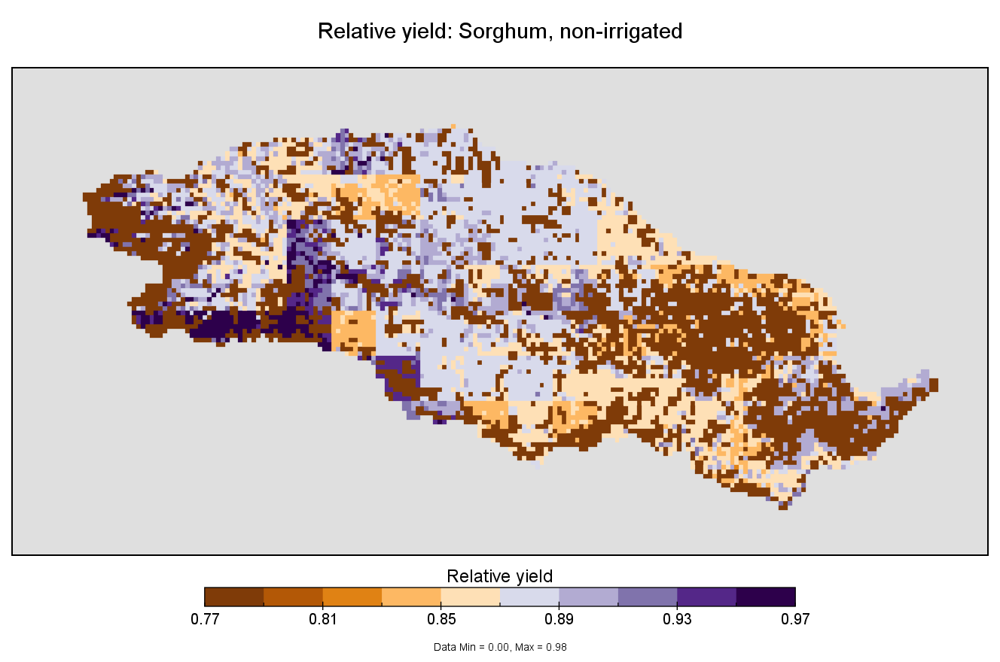

In [21]:
img = Image.open(photo_folder + '/relative_yield_sorghum.png')
img

## Reservoirs

Units are in m3, and represent the volumes of relevant reservoirs.

Here, we present the locations and names of the reservoirs of interest. 

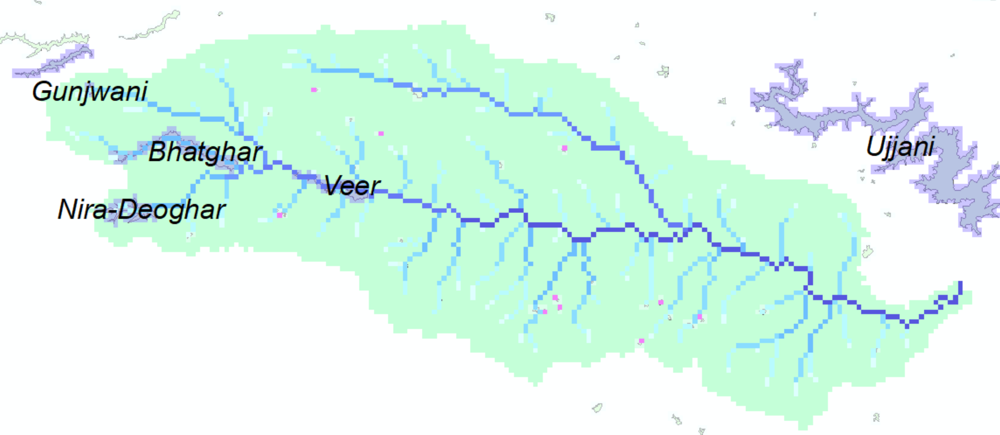

In [22]:
img = Image.open(photo_folder + '/reservoirs_onSarati.png')
img

In [23]:
Dam_names = ['Vir', 'Gunjvane', 'NiraDeoghar', 'Bhatghar']
Reservoirs_Sarati = Dam_names
Inds =  [(164,111), (143,55), (168,66), (159,84)]

Vars = [['lakeResStorage', 'Lake Level', 'Reservoir Volume', 'Volume (MCM)', 1000000.]]

SIMULATED_nc = []

for var in Vars:
    reservoir_nc_filename = output_folder +'/'+ var[0] + '_monthend.nc'
    SIMULATED_nc.append(Dataset(reservoir_nc_filename, 'r'))


In [24]:
DAMS = []

for i in range(len(Vars)): 
    Dams = []
    for inds in Inds:
        Dams.append(SIMULATED_nc[i].variables[Vars[i][0] + '_monthend'][:,inds[0], inds[1]]/Vars[i][4])
    DAMS.append(Dams)
    

In [25]:
for i in range(len(Vars)):
    
    fig = go.Figure()
    Dams = DAMS[i]
    
    for dam_i in range(len(Dams)):
        
        fig.add_trace(go.Scatter(y = Dams[dam_i],
                                 x = Dates_simulated,
                        mode='lines',
                        name=Dam_names[dam_i]))


    fig.update_layout(title = Vars[i][2] +', Simulated',
                           xaxis_title = 'Months',
                           yaxis_title = Vars[i][3])

    fig.show()

The following outputs may allow for easier input into Excel.

In [32]:
Dams = DAMS[0]

for dam_i in range(len(Dams)):
    print(Dam_names[dam_i])
    for seg in Dams: #[dam_i]:
        print(*seg, sep = ", ")
    print('\n')


Vir
0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 107.20837, 127.92889, 145.47165, 153.92323, 159.58865, 121.23749, 278.3, 230.0807, 177.974, 115.31542, 121.94008, 154.01672, 165.89113, 166.79613, 161.73141, 145.3691, 229.37785, 184.50432, 278.3, 217.72389, 211.26247, 118.70355, 183.67337, 196.442, 216.8819, 230.30493, 241.75024, 240.88403, 240.17854, 191.33736, 278.3, 239.99158, 264.6653, 187.37604, 200.76044, 243.61987, 246.73888, 250.46646, 241.99695, 220.70445, 196.46452, 160.95128, 278.3, 221.31197, 244.41228, 188.357, 231.83963, 220.10564, 241.01895, 250.44629, 250.39719, 247.12218, 245.71138, 150.39275, 278.3, 275.25644, 211.82549, 147.99814, 182.69096, 171.9599, 190.9204, 195.76501, 185.89723, 173.05508, 160.66191, 151.43863, 231.06491, 252.85661, 216.1607, 181.82591, 207.41338, 200.9921

272.79498, 251.23012, 224.43646, 198.85242, 182.47786, 208.23395, 614.51556, 593.643, 556.6921, 535.706, 500.90393, 465.68945, 432.0323, 400.3953, 364.7111, 329.1205, 296.2477, 275.02792, 340.84015, 393.56534, 400.4835, 372.512, 346.94656, 326.73392, 301.19604, 277.34497, 249.89276, 223.8476, 198.60243, 190.09004, 451.91302, 581.113, 538.3241, 509.69153, 474.0394, 439.44623, 405.69183, 373.32147, 337.4645, 303.86948, 272.90616, 322.90558, 462.2547, 598.5536, 566.9468, 531.0096, 498.44525, 463.6341, 429.38654, 397.7821, 363.7847, 331.62982, 299.37393, 307.97665, 627.923, 585.644, 538.223, 501.31558, 466.3955, 436.53116, 404.2745, 373.24634, 338.80872, 305.798, 286.01096, 282.5363, 625.9775, 564.79694, 546.92786, 510.31885, 481.51126, 447.64352, 413.86688, 381.89545, 347.56787, 315.1029, 283.05884, 293.28397, 632.9037, 590.27466, 587.1074, 538.85254, 503.28195, 470.99426, 436.6214, 403.88577, 367.47437, 333.0659, 299.026, 297.58075, 524.6025, 572.27026, 568.9949, 538.6546, 504.13852, 468

0.0, 0.0, 0.0, 0.0, 0.0, 12.290289, 175.73114, 181.08601, 164.22809, 143.48769, 119.15846, 98.81663, 81.66164, 66.458305, 48.708748, 28.984575, 9.39633, 0.0, 2.9058313, 17.52221, 12.288723, 0.030361792, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.1925974, 89.99411, 141.04405, 123.42548, 104.93512, 87.69278, 73.325264, 59.838062, 45.266296, 26.781973, 7.948815, 0.0, 19.263329, 64.14911, 135.7516, 127.66398, 109.15822, 93.22558, 79.24849, 66.635574, 53.957817, 38.847015, 23.251701, 6.1061797, 2.3648982, 153.08821, 160.39648, 138.49973, 115.63178, 97.59005, 83.4336, 70.307465, 56.95082, 40.27125, 22.522799, 8.839678, 0.62382245, 122.06809, 126.95362, 119.59605, 99.96602, 86.61931, 74.01986, 61.648678, 48.057465, 32.049995, 15.125651, 0.0, 4.7102156, 159.21988, 186.48926, 174.6575, 150.35313, 126.79195, 109.03236, 92.117004, 76.76811, 60.00931, 42.80876, 24.677288, 20.639328, 102.89051, 149.47388, 143.25961, 126.67297, 107.77646, 91.86845, 77.535934, 64.18723, 48.26949, 31.21614, 12.797445, 5.827

46.36695, 43.686382, 40.594097, 37.668053, 35.71256, 49.462868, 95.99764, 93.546906, 91.0547, 85.616234, 80.5632, 75.70423, 70.882355, 66.55422, 61.756325, 57.140903, 53.255825, 51.798824, 94.19925, 91.44827, 90.13746, 82.861626, 78.05739, 73.80595, 68.8762, 64.52881, 59.79226, 55.3983, 51.226963, 53.78624, 97.97639, 94.33859, 85.11014, 81.22384, 76.200356, 71.09424, 66.20087, 61.70014, 56.888767, 52.43458, 48.32189, 76.17529, 93.369446, 93.860855, 93.56142, 84.80595, 79.94822, 74.77803, 69.64361, 65.09106, 60.290047, 55.824356, 51.462387, 71.99297, 98.983795, 96.2812, 84.97415, 79.66125, 74.4817, 69.983665, 65.15873, 60.798595, 56.05913, 51.61322, 49.43966, 56.453243, 99.09775, 88.93218, 87.2495, 81.037476, 77.11014, 71.921165, 66.847145, 62.287846, 57.47199, 52.992393, 48.715984, 62.505283, 100.10979, 95.744705, 96.20528, 84.66023, 79.34417, 74.15561, 68.97976, 64.222466, 59.18406, 54.525375, 50.019157, 55.744587, 99.60691, 90.282295, 91.31808, 84.38038, 79.17693, 73.81211, 68.551605

0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 107.20837, 127.92889, 145.47165, 153.92323, 159.58865, 121.23749, 278.3, 230.0807, 177.974, 115.31542, 121.94008, 154.01672, 165.89113, 166.79613, 161.73141, 145.3691, 229.37785, 184.50432, 278.3, 217.72389, 211.26247, 118.70355, 183.67337, 196.442, 216.8819, 230.30493, 241.75024, 240.88403, 240.17854, 191.33736, 278.3, 239.99158, 264.6653, 187.37604, 200.76044, 243.61987, 246.73888, 250.46646, 241.99695, 220.70445, 196.46452, 160.95128, 278.3, 221.31197, 244.41228, 188.357, 231.83963, 220.10564, 241.01895, 250.44629, 250.39719, 247.12218, 245.71138, 150.39275, 278.3, 275.25644, 211.82549, 147.99814, 182.69096, 171.9599, 190.9204, 195.76501, 185.89723, 173.05508, 160.66191, 151.43863, 231.06491, 252.85661, 216.1607, 181.82591, 207.41338, 200.99216, 2

## Groundwater

Units are in metres, and represent depth to groundwater. 

In [ ]:
img = Image.open(photo_folder + '/depth_to_groundwater.png')
img